# LSTM

## Preprocessing

In [1]:
import os
import re
import shutil
import string

import pandas as pd
import numpy as np

In [2]:
df = pd.read_csv('../scrap2/combine_data4.csv')

df.head(10)

,Unnamed: 0,tweet,Label
0,90896,"Th blizzards R landing all over th ceiling, wa...",Sex Trafficking
1,47283,@LALewman What the dimwits fail to acknowledge...,Rape
2,33330,Good to know that @bbcnews @bbcworldservice do...,Rape
3,48737,S/O to all of you who want Roe V Wade overturn...,Rape
4,92382,@Mr_Macaaroni Sex worker industry fuels human ...,Sex Trafficking
5,66944,@EmuHouse @granddesigns @ExCeLLondon @Egoitali...,Sexual Harassment
6,2955,@ma_franks @Eve_Barlow @LuxAlptraum Why did sh...,Domestic Violence
7,78880,my job loves covering sexual harassment claims...,Sexual Harassment
8,36757,@ShotsCt @MegMB23 @tonyisacooldude @Nials5 @Ce...,Rape
9,38771,@RobMyers1968 @brianrayguitar Stop with the “e...,Rape


In [3]:
df['Label'].value_counts()

Rape                 28123
Sexual Harassment    25380
Domestic Violence    18172
Sex Trafficking       6969
Forced Marriage       3040
Forced Abortion       1338
Femicide              1338
Online Violence       1337
Name: Label, dtype: int64

## Filtering

In [4]:
REPLACE_WITH_SPACE = re.compile("(<br\s/><br\s/?)|(-)|(/)|(:).")

def remove_emoji(text):
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons
                           u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                           u"\U0001F680-\U0001F6FF"  # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

def remove_url(text): 
    url_pattern  = re.compile('http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+')
    return url_pattern.sub(r'', text)
 # converting return value from list to string

    
def remove_punct(text):
    delete_dict = {sp_character: '' for sp_character in string.punctuation} 
    delete_dict[' '] = ' '
    table = str.maketrans(delete_dict)
    return text.translate(table)

def remove_men(text):
    rev_men = re.sub('@[A-Za-z0-9_]+','', text)
    return rev_men

def remove_hash(text):
    rev_hash = re.sub("#[A-Za-z0-9_]+","", text)
    return rev_hash
    
#remove numbers, to lower case, remove character less than 2
def clean_text(text):
    textArr = text.split()
    text2 = ' '.join([w for w in textArr if ( not w.isdigit() and  ( not w.isdigit() and len(w)>2))])  
    text2 = REPLACE_WITH_SPACE.sub(" ", text2)
    return text2.lower()


In [5]:
df["clean_tweet"] = df.tweet.map(lambda x: remove_emoji(x))
df.head(10)

,Unnamed: 0,tweet,Label,clean_tweet
0,90896,"Th blizzards R landing all over th ceiling, wa...",Sex Trafficking,"Th blizzards R landing all over th ceiling, wa..."
1,47283,@LALewman What the dimwits fail to acknowledge...,Rape,@LALewman What the dimwits fail to acknowledge...
2,33330,Good to know that @bbcnews @bbcworldservice do...,Rape,Good to know that @bbcnews @bbcworldservice do...
3,48737,S/O to all of you who want Roe V Wade overturn...,Rape,S/O to all of you who want Roe V Wade overturn...
4,92382,@Mr_Macaaroni Sex worker industry fuels human ...,Sex Trafficking,@Mr_Macaaroni Sex worker industry fuels human ...
5,66944,@EmuHouse @granddesigns @ExCeLLondon @Egoitali...,Sexual Harassment,@EmuHouse @granddesigns @ExCeLLondon @Egoitali...
6,2955,@ma_franks @Eve_Barlow @LuxAlptraum Why did sh...,Domestic Violence,@ma_franks @Eve_Barlow @LuxAlptraum Why did sh...
7,78880,my job loves covering sexual harassment claims...,Sexual Harassment,my job loves covering sexual harassment claims...
8,36757,@ShotsCt @MegMB23 @tonyisacooldude @Nials5 @Ce...,Rape,@ShotsCt @MegMB23 @tonyisacooldude @Nials5 @Ce...
9,38771,@RobMyers1968 @brianrayguitar Stop with the “e...,Rape,@RobMyers1968 @brianrayguitar Stop with the “e...


In [8]:
df["clean_tweet"] = df.clean_tweet.map(lambda x: remove_url(x))
df.head(10)

,Unnamed: 0,tweet,Label,clean_tweet
0,90896,"Th blizzards R landing all over th ceiling, wa...",Sex Trafficking,"Th blizzards R landing all over th ceiling, wa..."
1,47283,@LALewman What the dimwits fail to acknowledge...,Rape,@LALewman What the dimwits fail to acknowledge...
2,33330,Good to know that @bbcnews @bbcworldservice do...,Rape,Good to know that @bbcnews @bbcworldservice do...
3,48737,S/O to all of you who want Roe V Wade overturn...,Rape,S/O to all of you who want Roe V Wade overturn...
4,92382,@Mr_Macaaroni Sex worker industry fuels human ...,Sex Trafficking,@Mr_Macaaroni Sex worker industry fuels human ...
5,66944,@EmuHouse @granddesigns @ExCeLLondon @Egoitali...,Sexual Harassment,@EmuHouse @granddesigns @ExCeLLondon @Egoitali...
6,2955,@ma_franks @Eve_Barlow @LuxAlptraum Why did sh...,Domestic Violence,@ma_franks @Eve_Barlow @LuxAlptraum Why did sh...
7,78880,my job loves covering sexual harassment claims...,Sexual Harassment,my job loves covering sexual harassment claims...
8,36757,@ShotsCt @MegMB23 @tonyisacooldude @Nials5 @Ce...,Rape,@ShotsCt @MegMB23 @tonyisacooldude @Nials5 @Ce...
9,38771,@RobMyers1968 @brianrayguitar Stop with the “e...,Rape,@RobMyers1968 @brianrayguitar Stop with the “e...


In [9]:
df["clean_tweet"] = df.clean_tweet.map(lambda x: remove_men(x))
df.head(10)

,Unnamed: 0,tweet,Label,clean_tweet
0,90896,"Th blizzards R landing all over th ceiling, wa...",Sex Trafficking,"Th blizzards R landing all over th ceiling, wa..."
1,47283,@LALewman What the dimwits fail to acknowledge...,Rape,What the dimwits fail to acknowledge is that ...
2,33330,Good to know that @bbcnews @bbcworldservice do...,Rape,Good to know that dont care about the rape o...
3,48737,S/O to all of you who want Roe V Wade overturn...,Rape,S/O to all of you who want Roe V Wade overturn...
4,92382,@Mr_Macaaroni Sex worker industry fuels human ...,Sex Trafficking,Sex worker industry fuels human trafficking. ...
5,66944,@EmuHouse @granddesigns @ExCeLLondon @Egoitali...,Sexual Harassment,Would you consider reporting this to th...
6,2955,@ma_franks @Eve_Barlow @LuxAlptraum Why did sh...,Domestic Violence,Why did she contact him post getting the or...
7,78880,my job loves covering sexual harassment claims...,Sexual Harassment,my job loves covering sexual harassment claims...
8,36757,@ShotsCt @MegMB23 @tonyisacooldude @Nials5 @Ce...,Rape,I never said take personal responsibility...
9,38771,@RobMyers1968 @brianrayguitar Stop with the “e...,Rape,Stop with the “exception for rape” crap. How...


In [10]:
df["clean_tweet"] = df.clean_tweet.map(lambda x: remove_hash(x))
df.head(10)

,Unnamed: 0,tweet,Label,clean_tweet
0,90896,"Th blizzards R landing all over th ceiling, wa...",Sex Trafficking,"Th blizzards R landing all over th ceiling, wa..."
1,47283,@LALewman What the dimwits fail to acknowledge...,Rape,What the dimwits fail to acknowledge is that ...
2,33330,Good to know that @bbcnews @bbcworldservice do...,Rape,Good to know that dont care about the rape o...
3,48737,S/O to all of you who want Roe V Wade overturn...,Rape,S/O to all of you who want Roe V Wade overturn...
4,92382,@Mr_Macaaroni Sex worker industry fuels human ...,Sex Trafficking,Sex worker industry fuels human trafficking. ...
5,66944,@EmuHouse @granddesigns @ExCeLLondon @Egoitali...,Sexual Harassment,Would you consider reporting this to th...
6,2955,@ma_franks @Eve_Barlow @LuxAlptraum Why did sh...,Domestic Violence,Why did she contact him post getting the or...
7,78880,my job loves covering sexual harassment claims...,Sexual Harassment,my job loves covering sexual harassment claims...
8,36757,@ShotsCt @MegMB23 @tonyisacooldude @Nials5 @Ce...,Rape,I never said take personal responsibility...
9,38771,@RobMyers1968 @brianrayguitar Stop with the “e...,Rape,Stop with the “exception for rape” crap. How...


In [13]:
import contractions as cons

""" Convert &amp; to and """
df.clean_tweet = df.clean_tweet.apply(lambda x: str(x).replace("Q&amp;A", "question and answer "))
df.clean_tweet = df.clean_tweet.apply(lambda x: str(x).replace("&amp;", "and"))
df.clean_tweet = df.clean_tweet.apply(lambda x: str(x).replace("’", "'"))
df.clean_tweet = df.clean_tweet.apply(lambda x: str(x).replace("´", "'"))
df.clean_tweet = df.clean_tweet.apply(lambda x: str(x).replace("&lt;", "<"))
df.clean_tweet = df.clean_tweet.apply(lambda x: str(x).replace("&gt;", ">"))
df.clean_tweet = df.clean_tweet.apply(lambda x: str(x).replace("&quot;", '"'))
df.clean_tweet = df.clean_tweet.apply(lambda x: str(x).replace("&apos;", "'"))

""" Remove Non-ASCII Characters """
df.clean_tweet = df.clean_tweet.apply(lambda x: re.sub(r'[^\x00-\x7F]', " ", x))

""" Clean Contractions """
df.clean_tweet = df.clean_tweet.apply(lambda x: cons.fix(str(x)))

In [14]:
df["clean_tweet"] = df.clean_tweet.map(lambda x: remove_punct(x))
df.head(10)

,Unnamed: 0,tweet,Label,clean_tweet
0,90896,"Th blizzards R landing all over th ceiling, wa...",Sex Trafficking,Th blizzards R landing all over th ceiling wal...
1,47283,@LALewman What the dimwits fail to acknowledge...,Rape,What the dimwits fail to acknowledge is that ...
2,33330,Good to know that @bbcnews @bbcworldservice do...,Rape,Good to know that do not care about the rape...
3,48737,S/O to all of you who want Roe V Wade overturn...,Rape,SO to all of you who want Roe V Wade overturne...
4,92382,@Mr_Macaaroni Sex worker industry fuels human ...,Sex Trafficking,Sex worker industry fuels human trafficking T...
5,66944,@EmuHouse @granddesigns @ExCeLLondon @Egoitali...,Sexual Harassment,Would you consider reporting this to th...
6,2955,@ma_franks @Eve_Barlow @LuxAlptraum Why did sh...,Domestic Violence,Why did she contact him post getting the or...
7,78880,my job loves covering sexual harassment claims...,Sexual Harassment,my job loves covering sexual harassment claims...
8,36757,@ShotsCt @MegMB23 @tonyisacooldude @Nials5 @Ce...,Rape,I never said take personal responsibility...
9,38771,@RobMyers1968 @brianrayguitar Stop with the “e...,Rape,Stop with the exception for rape crap How ...


In [16]:
""" Remove Numbers """
df.clean_tweet = df.clean_tweet.apply(lambda x: re.sub(r'[~^0-9]', " ", x))

In [17]:
df["clean_tweet"] = df.clean_tweet.map(lambda x: clean_text(x))
df.head(10)

,Unnamed: 0,tweet,Label,clean_tweet
0,90896,"Th blizzards R landing all over th ceiling, wa...",Sex Trafficking,blizzards landing all over ceiling walls and f...
1,47283,@LALewman What the dimwits fail to acknowledge...,Rape,what the dimwits fail acknowledge that ectopic...
2,33330,Good to know that @bbcnews @bbcworldservice do...,Rape,good know that not care about the rape women a...
3,48737,S/O to all of you who want Roe V Wade overturn...,Rape,all you who want roe wade overturned and who g...
4,92382,@Mr_Macaaroni Sex worker industry fuels human ...,Sex Trafficking,sex worker industry fuels human trafficking th...
5,66944,@EmuHouse @granddesigns @ExCeLLondon @Egoitali...,Sexual Harassment,would you consider reporting this the police s...
6,2955,@ma_franks @Eve_Barlow @LuxAlptraum Why did sh...,Domestic Violence,why did she contact him post getting the order...
7,78880,my job loves covering sexual harassment claims...,Sexual Harassment,job loves covering sexual harassment claims bu...
8,36757,@ShotsCt @MegMB23 @tonyisacooldude @Nials5 @Ce...,Rape,never said take personal responsibility for ra...
9,38771,@RobMyers1968 @brianrayguitar Stop with the “e...,Rape,stop with the exception for rape crap how many...


Print all cleaned tweet to see the output

In [21]:
for index, row in df.iterrows():
    doc = row["clean_tweet"]
    print(doc)
    print()

blizzards landing all over ceiling walls and floor our country suffering and this admin does not care laws being broken people dying people trafficking sex trade our border patrol and ice being put danger biden goes home delaware every weekend never border

what the dimwits fail acknowledge that ectopic pregnancy will kill both mother and fetus unless aborted plus russian soldiers rape their way thru ukraine impregnating women against their will brutally hostile cannot believe these men and misguided christians

good know that not care about the rape women and girls and not only the russian occupied areas north heartless the russian rapists actually ukrainian

all you who want roe wade overturned and who guess will providing financial support aid housing and other things that unfortunately women may not have now that they need carry term baby that came from rape incest could kill them

sex worker industry fuels human trafficking that why capitalism womens bodies for sale that also why 

yep all political dissidents from totalitarian states like china and islamofascist regimes will silenced anonymous will not able post victims domestic violence stalking and hacking will endangered have account great going

racial discrimination racial profiling none stop harassment years

sali con suya por mucho tiempo this sheds light all the men that too suffer domestic violence violence has gender

toxic feminity exists but this not example these would examples manipulation gaslighting and domestic violence which not gendered exclusive

and are not most sexual encounters are not rapeincest your own admission

you people are coddled muppets trying hide your bourgeois sentimentality behind prole suffering there are way more evil things that get memed ongallows humord than domestic violence police brutality war crimes climate collapse spare these very serious karen tears

national domestic violence hotline national network end domestic violence netsafe pantallas amigas project rockit r

what about rape incest will that also addressed

only amber heard had not cited domestic violence when divorcing johnny depp they would both living very successful lives right now fixed for you

men the violation womans body autonomy can become violation your own what alito proposing the rape humanity the state alito proposing sexual and procreation slavery the state alito attempting justify the ownership your body the state

could not even watch all this how very disappointing that domestic violence against man funny better

punishing them the full extent the law will not prevent rape and god does not work miracles through rapists

epic selfown the sex trafficking child predator

prevent politican flag people for harassment easy for

bartomeu buying year old players harassment laporta buying year old players flirting

there thoughteliminate rape and other forms sex abuse eliminate poverty and support birth control child care services and foster careadoption dislike abortion but seems 

yeah because rape and womens rights are sitcom people like you

you stupid dumbass fake ass doctor piece shit bitch rape literally forced sex you dumb fuck literally crying how fucking stupid you are right now

how long did take the democrats show anthony weiner the door the katie hill situation not clear with revenge porn and such but she longer office the republicans protect sexual deviants

sure did would simply based off the rape was reported not strong advocate for rapist only getting charged the accusation comes within certain timeframe where the proof the rape can proven coming from multiple time rape victim

let have men who rape young girls have say their pregnancy what sad state affairs

yup you are not professional any type not journalist not trauma centered advocate and quite frankly you are not victim sex trafficking you really need stop promoting yourself authority anything quite frankly

child marriage scourge our society and crucial that end this practice order safeguar

complete shock right nowi was masturbating abella danger when old son walked and asked true that amber heard falsely accused johnny domestic violence and had tell him the truth said yes was one the realest moments life

tell the world johnny tell them johnny depp victim domestic violence see how many people believe you amber heard

despite the resolution the criminal case kolfage and his build the wall group still face defamation suit brought the natl butterfly center nonprofit nature preserve the rio grande valley that accused promoting sex and human trafficking without evidence

nah tried give parents whose children were put harms way the cover more than one rape voice

the forced birth argument stupid you and whoever you slept with that night took that risk getting pregnant when you all chose get but what about rape how someone was conceived should not decide whether they live not

why late term what point the baby person the heart beat stage when has nerves and can feel pain when s


nah you are definitely the minority lol think unfair the unborn kid and quite honestly cruel maybe not have sex you not want kid the only instance would support rape case

finally harassment call what

dangerous would never advocate force someone carry term think unwanted different case rape incest might special cases but unwanted pregnancy that results from consensual sexual behavior there justification kill

hello air india are suffered lot pain and mental harassment also spent money from our pocket due the worst service which offered air india may know who responsible for this and who will compensate our loss

whatever the outcome this trial will acknowledged universally that men too are victims domestic violence

the gunt was circus and was setting ten tents each which represented pivitol point his online dumpster fire history what are the ten tent pole fiascos that come mind heal stream revenge porn and pillstream would that list for sure

zelensky thug why not hear about drugs g

about sue hiring manager for harassment she gives the same damn updates everyday

they threw bras burna boy while work without his consent human rights activists called sexy and romantic not sexual harassment the energy will change were the other way round

discussion the sadistic rape women who have been implanted with pincushion quote threatens nieces sexually

those godawful skyscrapers are built enslaved asians african nannies and housekeepers being killed work sex trafficking and organ harvesting could and but people like how looks posts lmao

admit this grandma adores johnny depp advocate hard for victims domestic violence always yes the time the victims are female lgbtq johnny depp was cont

rights your wants

you reckon domestic violence hotlines were being distributed the day lost the grammy like was the euro finals

its actually having conversation with itself like cleverbot when you click talk for literally really durable deformation what cleverbot and artificial intelligenc

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



not think they are smart enough run guns but they are not above aiding child sex trafficking

much more than that ectopic pregnancies can now kill women rape victims will forced carry their racists seed women are already being charged criminally for miscarrying red states the way pregnancies end miscarriage through fault the woman

does look like domestic violence maybe she should report and the name the perpetrator the police after all they were lenient with her last time

love how the gop board with aspiring dictators lack basic human decency craven corruption stacking courts with wildly unqualified bozos insurrections sextrafficking pedophiles and domestic terrorists but obviously fake orgy rumors are where they draw the line

needs permission call her out her lying she backed into corner and now wants scream harassment hey mtg where when you need them yeah checking out pizza parlor basements

nehrus earn money fighting case white official with serious crime such gang rape rape murd

domestic violence was the largest because reported maternal death

mainly dumb going because train young people violently run each other and sustain lifechanging neck and head injuries becoming burden families healthcare and welfare acc well lubricating domestic violence with alcohol abuse

episode big shot getting nerves cuz why carlsbad coach acting like that her big ass age are not way all that shit going was supposed allowed like pretty sure that counts harassment especially towards louise

seeing old homestucks talk about going back the good ole days just hilariously funny what good ole days the days groomers and spitting buckets the days rampant ableism harassment and weirdly intense worship big twitter accounts are golden era now

you are just going pretend rape does not happen

life the horror racket racket rico laundering racket cyber stalking stalking and invasion privacy torment torture horror that has been protected for long corruption the government all levels and does not

there also domestic violence bauers case even there was ozuna and osuna did fact assault their wives and they only were suspended and games respectively this just manfreds vendetta against bauer

targeted harassment towards

omg now you know the supreme court not supreme after all they lie they rapethey take part overthrowing the very govt they represent and who said they are not political yes they are see the hypocrisy the arrogance and the corruption

gave shot did not see harassment have nagging suspicion you are making

exciting news the city santa ana just passed resolution calling state elected officials pass legislation ending child marriage under exceptions mayor sarmiento for his leadership the council members who introduced and voted for

imagine asking your daughters what they thought about politician being accused multiple women assault and harassment and they answer that they only care about cutting taxes

show the law that back domestic violence

rape state india created 


also that the right stable and totally functional despite everything that has happen the last few decades obama kenyan conspiracy trump insurrection qanon and now the recent obsession with child sex trafficking

lot people involved proship discourse follow just wanted say that you supported the harassment recieved any way unfollow right now

honest not sure would trust woman who would not pull the plug halfblack rape baby way

not that the guy under investigation for child sex trafficking fbi next you sure was not his laptop they are talking about

but condoms are not working prevent unwanted pregnancies and pretty sure they have tried telling teenagers stop having sex laws against rape have not stopped unwanted pregnancies either you have stop them where they start the sperm

people believe cenk uygur involved elite child sextrafficking rings

report for sexual harassment enough enough

please fellow nigerians help retweet was wrongly over debited new credit and the said loan has not

happy for her cos most guy would have started domestic violence other drive her and marry another wife

human trafficking also very common other fields labor sex work not the problem human trafficking the latter just requires proper sex education and can guarantee that lack decrminalized legal sex work will only increase dangerous working conditions

had stop watching this was really painful watch you not make jokes about domestic violence was that audience would get and leave possibly give her the bird too

tweet more potent indian justice system than open rape and genocde call average case the lower courts takes years settle within hours team from assams police had flown guj nabbed mevani muni gets arrested days after rape threat and bail days

what about rape the guy removing the condom during sex

physical emotional abuse forced participation viewing pornographic materials marital rape against the law every state this country you are not anyones property national hotline

rape did 

this the dress code for the ipac internatl particle accelerator conference ipac also has nondiscrimination and antiharassment policy that includes physical appearance

forced marriage lovers stan also yes villain why lie

marsha blackburn supports child marriage because she groomer

guys nina says men not understand the hate and vitriol woman receive online because they never get abused like this true false share your stories abuse teasing harassment shaming slander

maybe matt was not sex trafficking minors for just himself matt appears cool with coke orgies also who can drag down with him

not you have friend who was arrested for child sex trafficking

ugh even even you were problem even you were the biggest problem which you are absolutely not problem all even harassing the customers problem people wrong harassing you wrong harassment wrong

also the lied under oath since amber has been arrested before due domestic violence but yeah for this expert ambers violence just minor action


less liekly forced marriage but you cannot increase higher than that why would raised that

sense dreadfulness when approaching life trying answer any phone call due harassment from all sorts collectors say too you cannot bleed turnip someone removes total indebtedness think that swell but not anticipating paying off

that your perception wrote two threads the latter being what you are referring which generalized rwaction the offteack comments the first thread now you please stop this harassment get off time line twitter has policies that too

blac chyna wants another shot under oath her case against the kardashians claiming the revenge porn pics shown her during her time the stand screwed her testimony any thoughts

reporters are truly the greatest threat the usa republicans meanwhile haters and losers claim expensive hoax sexual harassment worse

all know someone who was born from rape even that person themselves does not know

all about peace and love the left claims they are this p

since are going back the old days and banning abortion the person who committed the rapesexual assault should automatically get his dick cut off

first thing said when zelensky forced women and children leave unaccompanied male this disastrous puts them risk sex trafficking not naive surely military giants also control welfare funding for refugees many countries

here what else can change with this republican decision interracial marriage gay marriage forced sterilization contraception all need get out and vote vote against all republicans

fragile men they could only withstand the harassment women get daily basis perhaps they would develop empathy

while you were protecting donnie from impeachment you were sex trafficking year old

not paying much attention the deppheard circus but will say this much celebrities are not your friends not ever blindly swallow any narrative that fed you neither party completely innocent and kind gross domestic violence suit this public

over sex traffick

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



completely countys most recorded crime domestic violence and rises starkly around football season could write whole paper about this swear

chor chor kehna kab say harassment hogai hai please she would some light

the same people who church every sunday and hate you you not they only care about appearances what they actually usually pretty shitty one way the other whether something like not accepting your child for who they are rape just horrible people

reminder you harass and nag someone about certain thing over and over they are less likely what you want even listen that because you got them used nagging and harassment convincing not done being irritating asshole

the inconsistencies are never ending thanks for posting these the harassment campaign keep silent obvious flat earth

will you offering glen owen apology also tell your views angela rayners sexual harassment towards boris cos pretty sure boris was flashing his pork sword her while crossing and uncrossing his legs you would

stop using language that blames victims objectifies women and normalizes sexual harassment source

all women and girls must able participate sport fully participants officials coaches spectators otherwise and feel safe and included free from harassment bullying time

the only required training can recall was schoolwide session for new tas primarily focused avoiding sexual harassment which clear good and important topic

was seeing phsycologists help get clean surely she could have walked awaythe relationship had only just begun she could not have been too deep that point karen needs tell the truth domestic violence does happen men too

can you please just put girls allowed sign you could take sexual harassment claims more seriously instead censoring womens bodies what women wear does not decrease increase our value why change mogs and paintings better

the gqps version revenge porn

and brutal men still rape alarming levels and they still harm and kill their women folk when pregnancy n

unfortunately the fundamental infrastructure built dudes who not take online harassment abuse seriously which means there whole load underthehood problems because freeze peach libertarianism

child marriage still legal usa

help end republican grooming and sex trafficking minors

very happy someone are vocal and act immediately when comes sexual harassment situation angry the fact that myself cannot anything when was harassed before

the only evidence the teenagers carrying vulgar manner the word proven lier who also happens benefit pointing the finger the victims his harassment zero evidence what you allege

not harassment when you keep posting bullshit and point out bullshit you can fearfully block you cannot handle and this example your ridiculousness vaers reports the public database are shown their unverified stage

wishing everyone who celebrating very happy and peaceful

their harassment and cruelty rising day day may allah crush them

you want trans kids forced through puberty 

that man will rotting away jail and your family and friends will greatly miss you invest black women black women need more protection like their hair against domestic violence specifically

sir not omit the sanctity teachers bihar issuing vulgar guidelines teachers need respect honour and motivation not harassment dishonour and demotivation please understand sir

well not decide sterilize myself because afraid forced birth that okay because the state will probably decide for soon the ringwraiths overturn more privacyrelated decisions the last legal forced sterilization the was except for

you have obviously never met someone who was conceived rape and has been told their whole lives they should have been killed one saying this not horribly traumatic situation but killing innocent humans never the answer

ambers attorney bully just like she also why you think nobody has brought amber heards arrest and domestic violence charge for hitting former girlfriend tasya van ree this speaks her c

okay because did not happen she went their homes see they would interview and also confirm her informaron that not harassment literally just journalism

cyber harassment laws yous code section prohibits the federal crime stalking and has been amended include actions taken online harass injure harm intimidate person

was just helping british colleague with some stuff for work the end said thank you dear harassment

misleading russia stole kremia and started war donbas consequent rise nationalistic moods the country was warranted and real issue russian speaking people were never oppressed ukraine but obviously they will not let dictator rape and take their country

big win

sex crimes illegal lockdown parties tax fraud class drugs misuse illegally prorogue parliament unlawful ppe bns contracts illegal and inhumane human trafficking rwanda watching porn work sleaze now guilty manslaughter wtaf going

innocent children women and men are being victims sex trafficking daily basis georgia thi

how come women are prison for life but man who impregnated girl woman gets lesser charge woman there needs more jail time for the man think rape death penalty thoughts

cyberstalking and harassment which are serious offenses seek help

says growing matriarchal family made him effeminate calls rape and sexual harassment claims full rage against women says that guilt for being male made him want transition that the only interesting point made and wonder how common that

rape babies are the babies born

today help raise awareness domestic violence idp offer our support the work carried out garda och front line and all support services

brought rape victims dude you said okay for women who got raped get abortions and did not say that raped women fall the sleeping around category

you enjoy belittling domestic violence

this whole conversation just dumb just admit that are wrong actually just apologizing for sending harassment way

help make this sweet mothers day for some local moms specif

republicans next move what rape anyway

are out india you deliver things online and you want visit the nearest center your support people are telling return and then they are cancelling and not even returning the moneythis harassment

like wdym not harassment

and what tell those who become pregnant from rape

one would that case should like for rape incest case horror for the mom and dad

wear your support for while helping fulfill its mission protecting folx who protect those exercising their right abortion from the abusive harassment religious extremist protestors clinics one should stalked while seeking healthcare

until the internal charter and values company are not rectified match the living wage and basic protocols deal with harassment additional revenue will not address overreaching issues that legislation will not cover will not because represantves are incentivized not

evidently republicans are enabling and even supporting genocide ukraine rapeharassment racism low wages hi

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



## Removing Stopwords

In [22]:
from stop_words import get_stop_words
from nltk.corpus import stopwords

stop_words = list(get_stop_words("en"))
print(len(stop_words))

nltk_words = list(stopwords.words("english"))
print(len(nltk_words))

stop_words.extend(nltk_words)
print(len(stop_words))

stop_words = list(dict.fromkeys(stop_words))
stop_words.append("ugh")
stop_words.remove("not")
print(len(stop_words))

174
179
353
211


In [23]:
# Function to convert  
def listToString(s): 
    
    # initialize an empty string
    str1 = " " 
    
    # return string  
    return (str1.join(s))

In [24]:
corpus = []
for index, row in df.iterrows():
    doc = row["clean_tweet"]
    try:
        if np.isnan(doc):
            pass
    except:
        texts = doc.split()
        filter_word = []
        for text in texts:
            temp = re.sub(r'(.)\1+', r'\1\1', text)

            if temp.lower() not in stop_words:
                filter_word.append(temp)

        corpus.append(listToString(filter_word))

In [25]:
print(len(corpus))

85697


In [26]:
df['clean_tweet2'] = corpus
df

,Unnamed: 0,tweet,Label,clean_tweet,clean_tweet2
0,90896,"Th blizzards R landing all over th ceiling, wa...",Sex Trafficking,blizzards landing all over ceiling walls and f...,blizzards landing ceiling walls floor country ...
1,47283,@LALewman What the dimwits fail to acknowledge...,Rape,what the dimwits fail acknowledge that ectopic...,dimwits fail acknowledge ectopic pregnancy kil...
2,33330,Good to know that @bbcnews @bbcworldservice do...,Rape,good know that not care about the rape women a...,good know not care rape women girls not russia...
3,48737,S/O to all of you who want Roe V Wade overturn...,Rape,all you who want roe wade overturned and who g...,want roe wade overturned guess providing finan...
4,92382,@Mr_Macaaroni Sex worker industry fuels human ...,Sex Trafficking,sex worker industry fuels human trafficking th...,sex worker industry fuels human trafficking ca...
...,...,...,...,...,...
85692,91446,Sex trafficking is bad for the economy!!!!,Sex Trafficking,sex trafficking bad for the economy,sex trafficking bad economy
85693,74923,@bassie_hd @MAJDAL774632662 @lion_4_zion @AD_G...,Sexual Harassment,seems that your mind intellectually polluted a...,seems mind intellectually polluted carries not...
85694,4357,@Redlizzieredd @todd_spader Domestic Violence ...,Domestic Violence,domestic violence needs outlet they should gym...,domestic violence needs outlet gym feeling str...
85695,41500,@Steevec10 @theJagmeetSingh It's 9 months out ...,Rape,months out her entire life you should not murd...,months entire life not murder baby someone els...


Save Dataset

In [27]:
df.to_csv('cleaned_df.csv', header=True)

Read Dataset

In [28]:
df = pd.read_csv('cleaned_df.csv')

df

,Unnamed: 0.1,Unnamed: 0,tweet,Label,clean_tweet,clean_tweet2
0,0,90896,"Th blizzards R landing all over th ceiling, wa...",Sex Trafficking,blizzards landing all over ceiling walls and f...,blizzards landing ceiling walls floor country ...
1,1,47283,@LALewman What the dimwits fail to acknowledge...,Rape,what the dimwits fail acknowledge that ectopic...,dimwits fail acknowledge ectopic pregnancy kil...
2,2,33330,Good to know that @bbcnews @bbcworldservice do...,Rape,good know that not care about the rape women a...,good know not care rape women girls not russia...
3,3,48737,S/O to all of you who want Roe V Wade overturn...,Rape,all you who want roe wade overturned and who g...,want roe wade overturned guess providing finan...
4,4,92382,@Mr_Macaaroni Sex worker industry fuels human ...,Sex Trafficking,sex worker industry fuels human trafficking th...,sex worker industry fuels human trafficking ca...
...,...,...,...,...,...,...
85692,85692,91446,Sex trafficking is bad for the economy!!!!,Sex Trafficking,sex trafficking bad for the economy,sex trafficking bad economy
85693,85693,74923,@bassie_hd @MAJDAL774632662 @lion_4_zion @AD_G...,Sexual Harassment,seems that your mind intellectually polluted a...,seems mind intellectually polluted carries not...
85694,85694,4357,@Redlizzieredd @todd_spader Domestic Violence ...,Domestic Violence,domestic violence needs outlet they should gym...,domestic violence needs outlet gym feeling str...
85695,85695,41500,@Steevec10 @theJagmeetSingh It's 9 months out ...,Rape,months out her entire life you should not murd...,months entire life not murder baby someone els...


Find Maximum Sentence Length

In [29]:
df['Num_words_text'] = df['clean_tweet2'].apply(lambda x:len(str(x).split())) 
mask = df['Num_words_text'] >2
df = df[mask]
max_dataset_sentence_length  = df['Num_words_text'].max()
print('Dataset Max Sentence Length :'+str(max_dataset_sentence_length))

Dataset Max Sentence Length :42


Find Number of Words

In [30]:
from nltk.tokenize import word_tokenize
import nltk

def create_corpus_tk(my_df):
    corpus = []
    for text in my_df["clean_tweet2"]:
        words = [word.lower() for word in word_tokenize(text)]
        corpus.append(words)
    return corpus

In [31]:
corpus = create_corpus_tk(df)

num_words = len(corpus)
print(num_words)

83914


## Train/Test Split

In [32]:
from sklearn.model_selection import train_test_split

X = df['clean_tweet2']
Y = pd.get_dummies(df['Label']).values

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.20, random_state = 42) #shuffle = False)

In [44]:
try_Y = pd.DataFrame(Y)
try_Y

,0,1,2,3,4,5,6,7
0,0,0,0,0,0,0,1,0
1,0,0,0,0,0,1,0,0
2,0,0,0,0,0,1,0,0
3,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...
83909,0,0,0,0,0,0,1,0
83910,0,0,0,0,0,0,0,1
83911,1,0,0,0,0,0,0,0
83912,0,0,0,0,0,1,0,0


In [45]:
print(len(try_Y[try_Y[0] == 1]))
print(len(try_Y[try_Y[1] == 1]))
print(len(try_Y[try_Y[2] == 1]))
print(len(try_Y[try_Y[3] == 1]))
print(len(try_Y[try_Y[4] == 1]))
print(len(try_Y[try_Y[5] == 1]))
print(len(try_Y[try_Y[6] == 1]))
print(len(try_Y[try_Y[7] == 1]))

17991
1265
1325
2999
1313
27466
6939
24616


In [33]:
X_train

59953    likely see face public responsesharassment dis...
55027    like one girl posts domestic violence supporti...
68816             not know sometimes borderline harassment
31104    rape victims not regret either fact studies sh...
52777    sure not agree harassment either not think har...
                               ...                        
6420     hope since jeffrey epstein jeffrey epstein int...
56049    people treating defamationdomestic violence tr...
78445    except bills not consider mothers life like in...
887      reasons anonymity beyond let someone troll ins...
16154    abortion never used way birth control woman la...
Name: clean_tweet2, Length: 67131, dtype: object

In [34]:
Y_train

array([[0, 0, 0, ..., 0, 0, 1],
       [1, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 1],
       ...,
       [0, 0, 0, ..., 1, 0, 0],
       [0, 0, 0, ..., 0, 0, 1],
       [0, 0, 0, ..., 1, 0, 0]], dtype=uint8)

In [37]:
try_Y_train = pd.DataFrame(Y_train)
try_Y_test = pd.DataFrame(Y_test)

In [36]:
print(len(try_Y_train[try_Y_train[0] == 1]))
print(len(try_Y_train[try_Y_train[1] == 1]))
print(len(try_Y_train[try_Y_train[2] == 1]))
print(len(try_Y_train[try_Y_train[3] == 1]))
print(len(try_Y_train[try_Y_train[4] == 1]))
print(len(try_Y_train[try_Y_train[5] == 1]))
print(len(try_Y_train[try_Y_train[6] == 1]))
print(len(try_Y_train[try_Y_train[7] == 1]))

14414
1030
1040
2415
1060
22027
5570
19575


In [40]:
print(len(try_Y_test[try_Y_test[0] == 1]))
print(len(try_Y_test[try_Y_test[1] == 1]))
print(len(try_Y_test[try_Y_test[2] == 1]))
print(len(try_Y_test[try_Y_test[3] == 1]))
print(len(try_Y_test[try_Y_test[4] == 1]))
print(len(try_Y_test[try_Y_test[5] == 1]))
print(len(try_Y_test[try_Y_test[6] == 1]))
print(len(try_Y_test[try_Y_test[7] == 1]))

3577
235
285
584
253
5439
1369
5041


## Tokenization

In [46]:
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences

max_len = 50

In [47]:
tokenizer = Tokenizer(num_words=num_words)
tokenizer.fit_on_texts(X_train)

In [48]:
train_sequences = tokenizer.texts_to_sequences(X_train)

In [49]:
train_padded = pad_sequences(
    train_sequences, maxlen=max_len, truncating="post", padding="post"
)

In [50]:
train_padded

array([[ 371,   36,  227, ...,    0,    0,    0],
       [  10,   18,  197, ...,    0,    0,    0],
       [   1,   19,  663, ...,    0,    0,    0],
       ...,
       [ 385, 1260,    1, ...,    0,    0,    0],
       [ 281, 3718,  808, ...,    0,    0,    0],
       [  13,   39,  158, ...,    0,    0,    0]])

In [51]:
test_sequences = tokenizer.texts_to_sequences(X_test)
test_padded = pad_sequences(
    test_sequences, maxlen=max_len, truncating="post", padding="post"
)

In [52]:
test_padded

array([[   3,  321,   93, ...,    0,    0,    0],
       [2688,   66, 7027, ...,    0,    0,    0],
       [  39,  374, 1163, ...,    0,    0,    0],
       ...,
       [2121,  216,   67, ...,    0,    0,    0],
       [ 206,  416, 6117, ...,    0,    0,    0],
       [  59,    6, 1244, ...,    0,    0,    0]])

In [53]:
print(X_train[59953])
print(train_sequences[0])

likely see face public responsesharassment disproportionate crime meanwhile crime likely resulted average person caring tomb years say balance struck
[371, 36, 227, 154, 22909, 5818, 142, 1421, 142, 371, 2307, 1828, 73, 2164, 17199, 72, 38, 4380, 4156]


In [54]:
word_index = tokenizer.word_index
print("Number of unique words: ", len(word_index))

Number of unique words:  48798


In [55]:
word_index

{'not': 1,
 'rape': 2,
 'harassment': 3,
 'violence': 4,
 'domestic': 5,
 'women': 6,
 'sex': 7,
 'people': 8,
 'child': 9,
 'like': 10,
 'sexual': 11,
 'trafficking': 12,
 'abortion': 13,
 'men': 14,
 'incest': 15,
 'get': 16,
 'victims': 17,
 'one': 18,
 'know': 19,
 'think': 20,
 'also': 21,
 'even': 22,
 'victim': 23,
 'want': 24,
 'right': 25,
 'forced': 26,
 'woman': 27,
 'life': 28,
 'marriage': 29,
 'abuse': 30,
 'many': 31,
 'make': 32,
 'going': 33,
 'abortions': 34,
 'man': 35,
 'see': 36,
 'case': 37,
 'say': 38,
 'never': 39,
 'someone': 40,
 'children': 41,
 'time': 42,
 'still': 43,
 'need': 44,
 'cases': 45,
 'said': 46,
 'way': 47,
 'johnny': 48,
 'pregnancy': 49,
 'birth': 50,
 'take': 51,
 'support': 52,
 'stop': 53,
 'really': 54,
 'heard': 55,
 'baby': 56,
 'tell': 57,
 'let': 58,
 'believe': 59,
 'control': 60,
 'depp': 61,
 'well': 62,
 'world': 63,
 'care': 64,
 'every': 65,
 'thing': 66,
 'got': 67,
 'good': 68,
 'much': 69,
 'amber': 70,
 'pregnant': 71,
 'yea

## Create Embedding Dictionary

In [56]:
embedding_dict = {}
f = open("../GloVe/GloVe_Twitter/glove.twitter.27B.100d.txt", encoding="utf8")
for line in f:
    values = line.split()
    word = values[0]
    vectors = np.asarray(values[1:], "float32")
    embedding_dict[word] = vectors
f.close()

In [57]:
embedding_dict

{'<user>': array([ 0.63006  ,  0.65177  ,  0.25545  ,  0.018593 ,  0.043094 ,
         0.047194 ,  0.23218  ,  0.11613  ,  0.17371  ,  0.40487  ,
         0.022524 , -0.076731 , -2.2911   ,  0.094127 ,  0.43293  ,
         0.041801 ,  0.063175 , -0.64486  , -0.43657  ,  0.024114 ,
        -0.082989 ,  0.21686  , -0.13462  , -0.22336  ,  0.39436  ,
        -2.1724   , -0.39544  ,  0.16536  ,  0.39438  , -0.35182  ,
        -0.14996  ,  0.10502  , -0.45937  ,  0.27729  ,  0.8924   ,
        -0.042313 , -0.009345 ,  0.55017  ,  0.095521 ,  0.070504 ,
        -1.1781   ,  0.013723 ,  0.17742  ,  0.74142  ,  0.17716  ,
         0.038468 , -0.31684  ,  0.08941  ,  0.20557  , -0.34328  ,
        -0.64303  , -0.878    , -0.16293  , -0.055925 ,  0.33898  ,
         0.60664  , -0.2774   ,  0.33626  ,  0.21603  , -0.11051  ,
         0.0058673, -0.64757  , -0.068222 , -0.77414  ,  0.13911  ,
        -0.15851  , -0.61885  , -0.10192  , -0.47     ,  0.19787  ,
         0.42175  , -0.18458  ,  0.080

In [58]:
num_words = len(word_index) + 1
embedding_matrix = np.zeros((num_words, 100))

for word, i in word_index.items():
    if i < num_words:
        emb_vec = embedding_dict.get(word)
        if emb_vec is not None:
            embedding_matrix[i] = emb_vec

In [59]:
embedding_matrix

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.083973  , -0.091833  ,  0.08635   , ...,  0.17608   ,
         0.28885999, -0.25102001],
       [ 0.50972998,  0.21831   , -0.65434998, ...,  0.17145   ,
         0.68470001, -0.62875003],
       ...,
       [ 0.42087999, -0.029635  , -0.65109998, ...,  0.69213998,
         0.016377  ,  0.33072001],
       [ 0.12453   ,  0.31512001, -0.15834001, ...,  0.62023997,
        -0.11181   ,  0.37673   ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ]])

In [60]:
print(train_padded.shape)
print(Y_train.shape)

(67131, 50)
(67131, 8)


In [61]:
print(test_padded.shape)
print(Y_test.shape)

(16783, 50)
(16783, 8)


## Baseline Model with GloVe

In [62]:
from keras.models import Sequential
from keras.layers import Embedding, LSTM, Dense, Dropout, Bidirectional
from keras.initializers import Constant
from tensorflow.keras.optimizers import Adam

model = Sequential()

model.add(
    Embedding(
        num_words,
        100,
        embeddings_initializer=Constant(embedding_matrix),
        input_length=max_len,
        trainable=False,
    )
)
model.add(LSTM(100)) #, dropout=0.1
#model.add(Bidirectional(LSTM(100)))
model.add(Dense(100, activation='relu'))
model.add(Dense(8,activation="softmax"))

optimizer = Adam(learning_rate=3e-4)

model.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])

In [63]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 50, 100)           4879900   
                                                                 
 lstm (LSTM)                 (None, 100)               80400     
                                                                 
 dense (Dense)               (None, 100)               10100     
                                                                 
 dense_1 (Dense)             (None, 8)                 808       
                                                                 
Total params: 4,971,208
Trainable params: 91,308
Non-trainable params: 4,879,900
_________________________________________________________________


In [64]:
history = model.fit(
    train_padded,
    Y_train,
    epochs=20,
    validation_data=(test_padded, Y_test),
    verbose=1,
)

Epoch 1/20
2098/2098 [==============================] - 108s 49ms/step - loss: 0.1888 - accuracy: 0.6558 - val_loss: 0.0561 - val_accuracy: 0.9146
Epoch 2/20
2098/2098 [==============================] - 135s 64ms/step - loss: 0.0473 - accuracy: 0.9314 - val_loss: 0.0357 - val_accuracy: 0.9470
Epoch 3/20
2098/2098 [==============================] - 98s 47ms/step - loss: 0.0328 - accuracy: 0.9532 - val_loss: 0.0272 - val_accuracy: 0.9612
Epoch 4/20
2098/2098 [==============================] - 129s 61ms/step - loss: 0.0243 - accuracy: 0.9635 - val_loss: 0.0196 - val_accuracy: 0.9706
Epoch 5/20
2098/2098 [==============================] - 138s 66ms/step - loss: 0.0196 - accuracy: 0.9709 - val_loss: 0.0183 - val_accuracy: 0.9734
Epoch 6/20
2098/2098 [==============================] - 133s 63ms/step - loss: 0.0173 - accuracy: 0.9742 - val_loss: 0.0157 - val_accuracy: 0.9769
Epoch 7/20
2098/2098 [==============================] - 129s 61ms/step - loss: 0.0153 - accuracy: 0.9775 - val_loss: 0.

## Save Model

In [65]:
from tensorflow import keras

model.save('lstm_model1')
model = keras.models.load_model('lstm_model1')

INFO:tensorflow:Assets written to: lstm_model1\assets


INFO:tensorflow:Assets written to: lstm_model1\assets


In [66]:
import json

with open('lstm_history1.json', 'w') as f:
    json.dump(history.history, f)

In [1]:
import json

f = open('lstm_history1.json')
history = json.load(f)

In [ ]:
history??

## Evaluation

In [68]:
accr = model.evaluate(test_padded,Y_test)
print('Test set\n  Loss: {:0.3f}\n  Accuracy: {:0.3f}'.format(accr[0],accr[1]))

525/525 [==============================] - 9s 15ms/step - loss: 0.0127 - accuracy: 0.9830
Test set
  Loss: 0.013
  Accuracy: 0.983


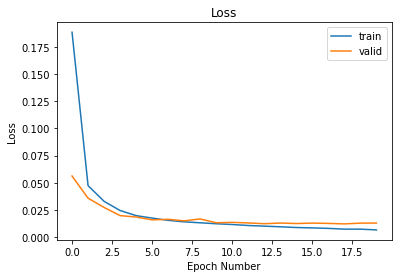

In [2]:
import matplotlib.pyplot as plt

plt.title('Loss')
plt.plot(history['loss'], label='train')
plt.plot(history['val_loss'], label='valid')
plt.xlabel('Epoch Number')
plt.ylabel('Loss')
plt.legend()
plt.show();

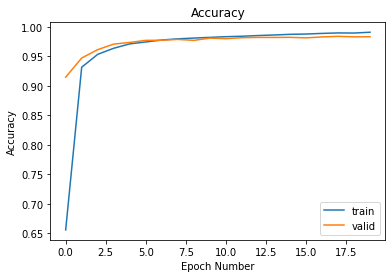

In [3]:
plt.title('Accuracy')
plt.plot(history['accuracy'], label='train')
plt.plot(history['val_accuracy'], label='valid')
plt.xlabel('Epoch Number')
plt.ylabel('Accuracy')
plt.legend()
plt.show();

In [71]:
sequences = tokenizer.texts_to_sequences(X_test)
padded_y = pad_sequences(sequences, maxlen=max_len, padding="post", truncating="post")

In [72]:
pred_y = model.predict(padded_y)
pred_y_int = pred_y.round().astype("int")

In [73]:
import matplotlib.pyplot as plt

def plot_value_array(i, predictions_array, true_label):
  labels = [0,1,2,3,4,5,6,7] #['Domestic Violence', 'Rape', 'Sexual Harassment', 'Sex Trafficking', 'Forced Marriage', 
          #'Online Violence', 'femicide', 'forced abortion']
  true_label = true_label
  plt.grid(False)
  plt.xticks(range(8))
  plt.yticks([])
  vector = np.vectorize(np.float64)
  h = vector(predictions_array.reshape(1, -1))
  thisplot = plt.bar(range(8), h[0], color="#777777")
  plt.ylim([0, 1])
  predicted_label = labels[np.argmax(predictions_array.reshape(1, -1))]

  thisplot[predicted_label].set_color('red')
  thisplot[true_label].set_color('blue')

men emotions men experience abuse domestic violence men able express feelings report abuse vocal praying every man going thru something silently
Domestic Violence 46% (Domestic Violence)


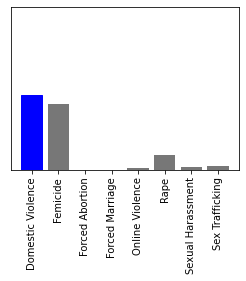

In [75]:
#print(pred, labels[np.argmax(pred)])

i = 5000
reverse_word_index = dict([(value, key) for (key, value) in word_index.items()])

def decode(text):
    return " ".join([reverse_word_index.get(i, "?") for i in text])

my_word = decode(sequences[i])
print(my_word)
new_data = [my_word]
seq = tokenizer.texts_to_sequences(new_data)
padded = pad_sequences(seq, maxlen=max_len)
pred = model.predict(padded)
labels = [0,1,2,3,4,5,6,7] 
label = labels[np.argmax(Y_test[i])]
class_names = ['Domestic Violence', 'Femicide', 'Forced Abortion', 'Forced Marriage',
               'Online Violence', 'Rape', 'Sex Trafficking', 'Sexual Harassment']

print("{} {:2.0f}% ({})".format(class_names[labels[np.argmax(pred)]],
                                100*np.max(pred),
                                class_names[label]))

plt.figure(figsize=(9,3))
plt.subplot(1,2,1)
plot_value_array(i, pred,  label)
_ = plt.xticks(range(8), class_names, rotation=90)
plt.show()

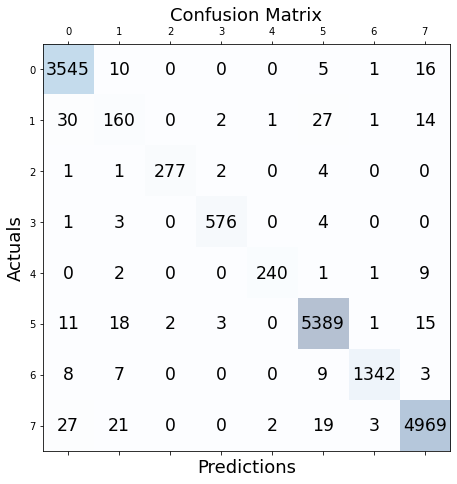

In [77]:
from sklearn.metrics import confusion_matrix
# Calculate the confusion matrix
#
y_pred = []
test_label = []
for i in range(len(pred_y)):
    vector = np.vectorize(np.float64)
    predY = vector(pred_y[i])
    y_pred.append(np.argmax(predY))
    test_label.append(np.argmax(Y_test[i]))

conf_matrix = confusion_matrix(y_true=test_label, y_pred=y_pred) #, labels=class_names
#
# Print the confusion matrix using Matplotlib
#
fig, ax = plt.subplots(figsize=(7.5, 7.5))
ax.matshow(conf_matrix, cmap=plt.cm.Blues, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

In [78]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

print(confusion_matrix(Y_test.argmax(axis=1),pred_y.argmax(axis=1)))
print(classification_report(Y_test.argmax(axis=1),pred_y.argmax(axis=1),target_names=class_names))
print(accuracy_score(Y_test.argmax(axis=1),pred_y.argmax(axis=1)))

[[3545   10    0    0    0    5    1   16]
 [  30  160    0    2    1   27    1   14]
 [   1    1  277    2    0    4    0    0]
 [   1    3    0  576    0    4    0    0]
 [   0    2    0    0  240    1    1    9]
 [  11   18    2    3    0 5389    1   15]
 [   8    7    0    0    0    9 1342    3]
 [  27   21    0    0    2   19    3 4969]]
                   precision    recall  f1-score   support

Domestic Violence       0.98      0.99      0.98      3577
         Femicide       0.72      0.68      0.70       235
  Forced Abortion       0.99      0.97      0.98       285
  Forced Marriage       0.99      0.99      0.99       584
  Online Violence       0.99      0.95      0.97       253
             Rape       0.99      0.99      0.99      5439
Sexual Harassment       0.99      0.98      0.99      1369
  Sex Trafficking       0.99      0.99      0.99      5041

         accuracy                           0.98     16783
        macro avg       0.95      0.94      0.95     16783
    